<a href="https://colab.research.google.com/github/FelDeRex/AI-Final-Task/blob/main/Final_task.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Выполнил студент группы 580-3 Погудин В.Ю.

#Задание: 
построить модель классификации на наборе данных Body Performance, сделать простое веб-приложение на Gradio

#Получение набора данных

In [1]:
!wget https://gist.githubusercontent.com/Yegorov/dc61c42aa4e89e139cd8248f59af6b3e/raw/20ac954e202fe6a038c2b4bb476703c02fe0df87/ya.py
!chmod +x ya.py
!./ya.py https://disk.yandex.ru/d/5mI0kbSLSBD01w path/to/directory

--2023-05-18 09:04:58--  https://gist.githubusercontent.com/Yegorov/dc61c42aa4e89e139cd8248f59af6b3e/raw/20ac954e202fe6a038c2b4bb476703c02fe0df87/ya.py
Resolving gist.githubusercontent.com (gist.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to gist.githubusercontent.com (gist.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 723 [text/plain]
Saving to: ‘ya.py’

ya.py               100%[===================>]     723  --.-KB/s    in 0s      

2023-05-18 09:04:58 (7.54 MB/s) - ‘ya.py’ saved [723/723]

--2023-05-18 09:04:59--  https://downloader.disk.yandex.ru/disk/38d94312b635a90d648a01a0a494096872a97f2138676a61200f69033e1a6564/6466227b/3v-krRA316KhQDn3zNPZX4HwlF4GN3JWIreVvZxgwp5qDAS3vC3MQK5zb8U0e3jnFqu1d7h7QYc-A-Qe92CoeA%3D%3D?uid=0&filename=bodyPerformance-dataset.csv&disposition=attachment&hash=hvFexZEHC6eeKFCtkKHvUUckNBy15/z6BX6on7TNH6yQSNKp/cz%2B/HTbJS%2BVLI/bq/J6bpmRyOJonT3Vo

In [2]:
import pandas as pd
# считываем набор данных
df = pd.read_csv("/content/bodyPerformance-dataset.csv", sep=';')

In [ ]:
df

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
0,27.0,M,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,C
1,25.0,-,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,A
2,31.0,M,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,C
3,32.0,M,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,B
4,28.0,M,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,B
...,...,...,...,...,...,...,...,...,...,...,...,...
13388,25.0,M,172.1,71.80,16.2,74.0,141.0,35.8,17.4,47.0,198.0,C
13389,21.0,M,179.7,63.90,12.1,74.0,128.0,33.0,1.1,48.0,167.0,D
13390,39.0,M,177.2,80.50,20.1,78.0,132.0,63.5,16.4,45.0,229.0,A
13391,64.0,F,146.1,57.70,40.4,68.0,121.0,19.3,9.2,0.0,75.0,D


In [ ]:
df.columns

Index(['age', 'gender', 'height_cm', 'weight_kg', 'body fat_%', 'diastolic',
       'systolic', 'gripForce', 'sit and bend forward_cm', 'sit-ups counts',
       'broad jump_cm', 'class'],
      dtype='object')

In [ ]:
df.dtypes

age                        float64
gender                      object
height_cm                  float64
weight_kg                  float64
body fat_%                 float64
diastolic                  float64
systolic                   float64
gripForce                  float64
sit and bend forward_cm    float64
sit-ups counts             float64
broad jump_cm              float64
class                       object
dtype: object

#Описание набора данных

Набор данных - Body Performance, данные для оценки физического состояния человека.

13393 строк, 12 признаков.

1. age: возраст, лет

2. gender: пол

3. weight_kg: вес в килограммах

3. height_cm: высота в сантиметрах

4. body_fat: процент жира

5. diastolic: диастолическое артериальное давление

6. systolic: систолическое артериальное давление

7. gripForce: сила сжатия кулака (оценка с помощью динамометра)

8. sit and bend forward_cm: Наклон вперед из положения сидя, результат в сантиметрах (от пяток до кончиков пальцев).

9. sit-ups counts: количество подъемов корпуса из положения лежа за 2 минуты

10. broad jump_cm результат прыжка в длину

11. class: класс оценки физического состочния : A,B,C,D (A - лучший)

Источник - Корейский фонд содействия развитию спорта

Устанавливаем пакет для первоначального разведочного анализа данных (Exploratory Data Analysis, EDA)

In [ ]:
!pip install sweetviz

/usr/local/lib/python3.10/dist-packages/sweetviz/dataframe_report.py:74: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  all_source_names = [cur_name for cur_name, cur_series in source_df.iteritems()]
/usr/local/lib/python3.10/dist-packages/sweetviz/dataframe_report.py:109: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  filtered_series_names_in_source = [cur_name for cur_name, cur_series in source_df.iteritems()


                                             |          | [  0%]   00:00 -> (? left)

/usr/local/lib/python3.10/dist-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
/usr/local/lib/python3.10/dist-packages/sweetviz/series_analyzer_cat.py:28: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for item in category_counts.iteritems():
/usr/local/lib/python3.10/dist-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
/usr/local/lib/python3.10/dist-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  st


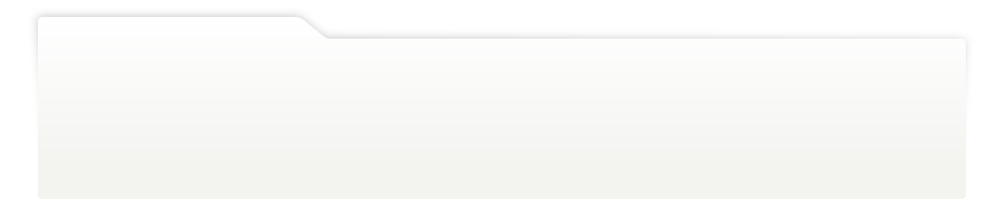
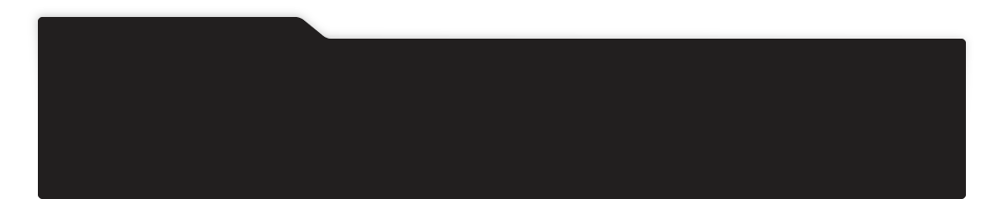
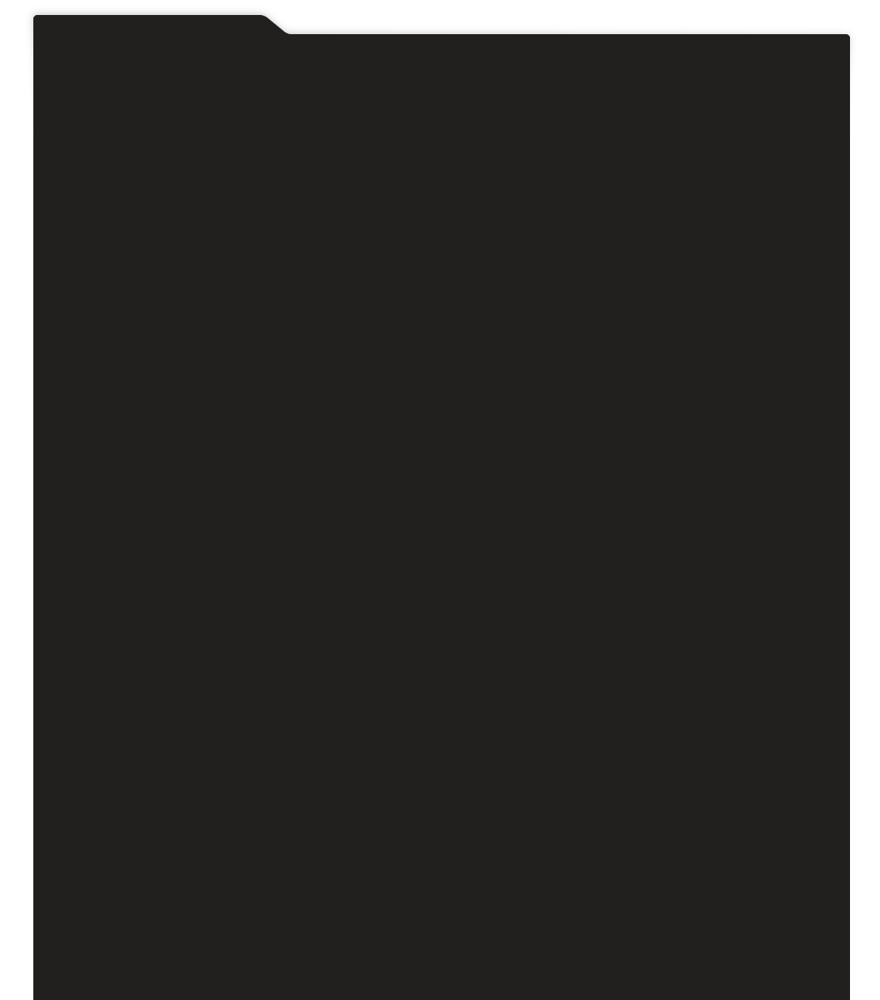
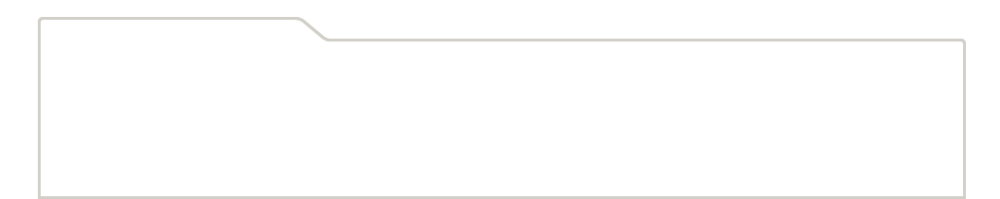
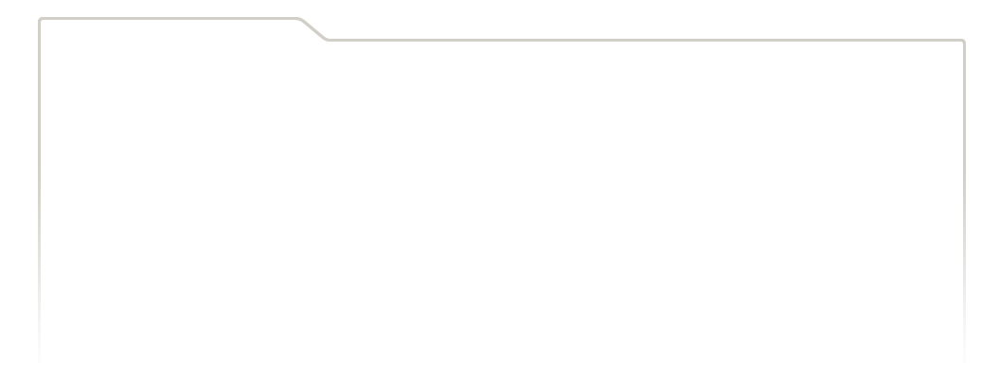
...
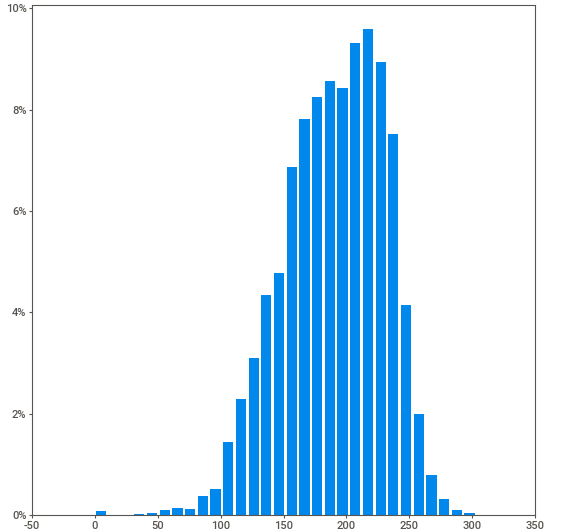
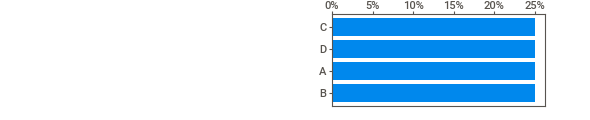
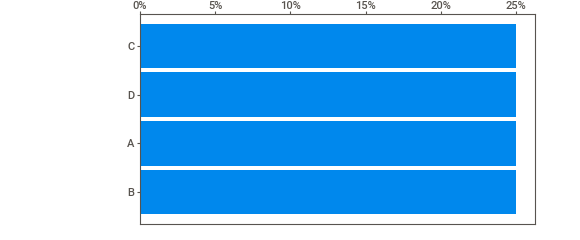
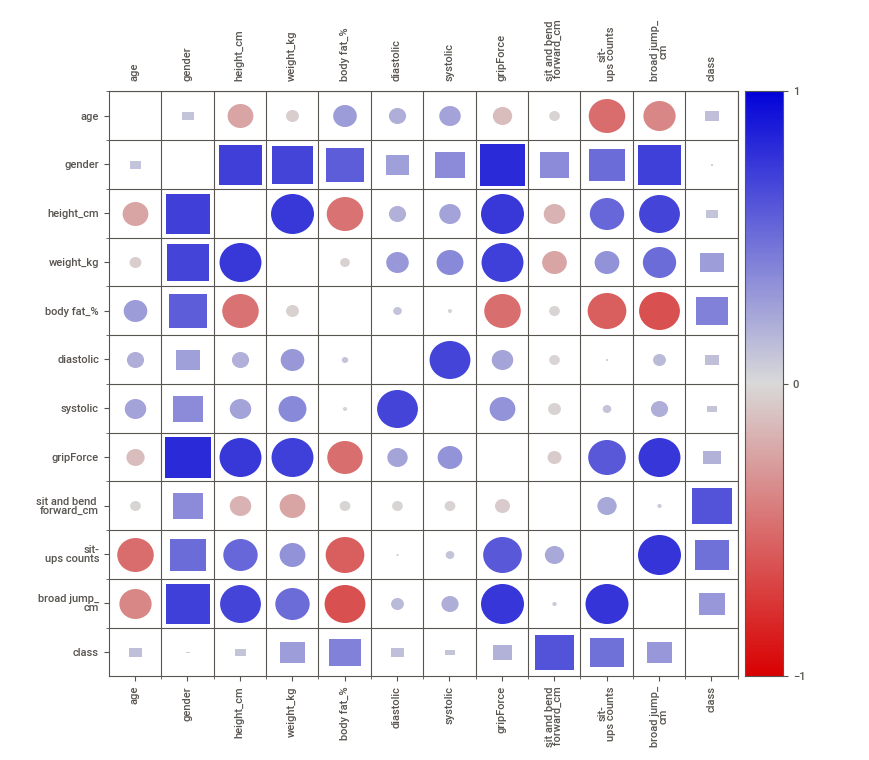
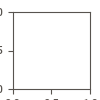

In [ ]:
import sweetviz as sv
report = sv.analyze(df)
report.show_notebook()

In [ ]:
!pip install ydata_profiling

In [ ]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df, title="Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 1. Анализ данных

Рассмотрим корелляции между переменными. Из полученных данных видно, что больше всего на оценку физического состояния влияет значение переменной наклона вперед из положения сидя, то есть наилучшим предиктором для переменной class является переменная sit and bend forward_cm. Чем дальше человек наклоняется, тем лучше оценка его состояния.

Сильно влияет и количество подъемов корпуса из положения лежа (sit-ups counts), а также процент жира (body fat_%) - большой процент жира ведет к плохой оценке. 

Хорошая связь переменной class имеется со значением веса участников (weight_kg) и их результатами в прыжках в длину (broad jump_cm). 
В меньшей степени уже оказывает влияние сила сжатия кулака (gripForce). 

Малая связь наблюдается со стороны возраста (age), диастолического артериального давления (diastolic), систолического артериального давления (systolic), а также роста (height_cm).

В тоже время мы можем отметить, что пол (gender) практически никак не влияет на оценку физического состояния. Но у пола есть большая корелляция с силой хвата. Немного меньше с ростом, прыжками в длину и весом. Очевидно, что в большинсве данные параметры будут выше у мужчин.

Можно видеть высокую корреляцию между силой хвата и прыжками в длину, а также между подъемами корпуса и опять же прыжками в длину.

## 2. Устранение дубликатов

Необходимо устранить строки-дубликаты, так как они не несут никакой ценности для решаемой задачи классификации.

In [22]:
df.drop_duplicates()

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
0,27.0,1,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,2
1,25.0,1,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,0
2,31.0,1,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,2
3,32.0,1,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,1
4,28.0,1,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
13388,25.0,1,172.1,71.80,16.2,74.0,141.0,35.8,17.4,47.0,198.0,2
13389,21.0,1,179.7,63.90,12.1,74.0,128.0,33.0,1.1,48.0,167.0,3
13390,39.0,1,177.2,80.50,20.1,78.0,132.0,63.5,16.4,45.0,229.0,0
13391,64.0,0,146.1,57.70,40.4,68.0,121.0,19.3,9.2,0.0,75.0,3


#3. Устранение пропусков


Необходимо устранить пропуски в данных.

In [4]:
# Проверяем наличие пропусков до
df.isnull().values.any()

True

In [5]:
# устраняем пропуски
df = df.interpolate()

In [6]:
# Проверяем наличие пропусков после
df.isnull().values.any()

False

# 4. Работа с категориальными данными

Необходимо преобразовать категориальные данные в числовой вид.

In [7]:
import numpy as np

In [ ]:
# категориальных признака в данных - два
df.dtypes

age                        float64
gender                      object
height_cm                  float64
weight_kg                  float64
body fat_%                 float64
diastolic                  float64
systolic                   float64
gripForce                  float64
sit and bend forward_cm    float64
sit-ups counts             float64
broad jump_cm              float64
class                       object
dtype: object

In [111]:
np.unique(df['gender'])

array(['-', 'F', 'M'], dtype=object)

Поскольку у нас имеются пропуски в колонке с полом необходимо их заполнить. 

In [8]:
index = df[df['gender']=='-'].index
df.loc[index]

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
1,25.0,-,165.0,55.8,15.7,77.0,126.0,36.4,16.3,53.0,229.0,A
48,28.0,-,180.1,82.1,15.0,83.0,147.0,52.6,18.8,55.0,247.0,A


Для этого используем значение колонки gripForce силы сжатия поскольку она имеет наибольшую корелляцию с полом. По среднему значению хвата среди мужчин и женщин будет относить к определенному полу.

In [9]:
dfMale = df[df['gender']=='M']
dfFemale = df[df['gender']=='F']
gripForceMale = dfMale['gripForce'].sum()/df['gripForce'].size
gripForceFemale = dfFemale['gripForce'].sum()/df['gripForce'].size
gripForceAverage = (gripForceMale + gripForceFemale) /2

for i in index:
  gripForce = df.loc[i,'gripForce']
  if gripForce >= gripForceAverage:
    gender = 'M'
  else:
    gender = 'F'
  df.loc[i,'gender'] = gender

df.loc[index]

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
1,25.0,M,165.0,55.8,15.7,77.0,126.0,36.4,16.3,53.0,229.0,A
48,28.0,M,180.1,82.1,15.0,83.0,147.0,52.6,18.8,55.0,247.0,A


In [10]:
np.unique(df['class'])

array(['A', 'B', 'C', 'D'], dtype=object)

Будем использовать LabelEncoder для преобразования.

In [11]:
from sklearn.preprocessing import LabelEncoder
le1 = LabelEncoder()
df['gender'] = le1.fit_transform(df['gender'].to_numpy())
le2 = LabelEncoder()
df['class'] = le2.fit_transform(df['class'].to_numpy())

In [12]:
np.unique(df['gender'])

array([0, 1])

In [13]:
np.unique(df['class'])

array([0, 1, 2, 3])

#5. Выделение целевой переменной y и массива входных признаков X

В данном случае решается задача классификации, определение категории физического состояния на основе данных о росте, весе, результатах физ. тестов и т.д.

Целевая переменная y - колонка class (df['class']), все остальное - входные признаки X

In [14]:
X = df.to_numpy()[:, :-1]
y = df.to_numpy()[:, -1]

# 6. Кросс-валидация, обучение модели

Обучим модель с использованием пятикратной кросс-валидации - для этого будем использовать: 

https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.StratifiedKFold.html#sklearn.model_selection.StratifiedKFold

В качестве обучающей модели будем использовать классификатор XGBClassifier из библиотеки XGBoost.

In [15]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier

skf = StratifiedKFold(n_splits=5)
acc = []
for i, (train_index, test_index) in enumerate(skf.split(X, y)):
  X_train = X[train_index]
  X_test = X[test_index]
  y_train = y[train_index]
  y_test = y[test_index]
  model = XGBClassifier()
  model.fit(X_train, y_train)
  acc.append(accuracy_score(y_test, model.predict(X_test)))
print("Accuracy: ", np.mean(acc) * 100, " %")

Accuracy:  75.15869146273914  %


В результате точность составила выше 75 %.



Необходимо обучить итоговую модель на всех данных, чтобы именно она работала в веб-приложении

In [23]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()
model = XGBClassifier()
model.fit(X, y)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

# 7. Веб-приложение Gradio

С помощью пакета Gradio, сделаем небольшое веб-приложение, для работы модели.

In [17]:
!pip install gradio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.4/17.4 MB 53.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 51.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.0/57.0 kB 5.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 288.1/288.1 kB 26.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.3/75.3 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 25.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.5/50.5 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.2/137.2 kB 14.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 k

In [32]:
from pandas.io.formats.info import WriteBuffer
import gradio as gr
import pandas as pd

inputs = [gr.Dataframe(row_count = (1, "dynamic"), col_count=(11,"fixed"), label="Input Data", 
                       headers=["age", "gender", "weight_kg", "height_cm", "body_fat", "diastolic", "systolic", "gripForce", 
                                "sit and bend forward_cm", "sit-ups counts", "broad jump_cm"], interactive=1)]

outputs = [gr.Dataframe(row_count = (1, "dynamic"), col_count=(1, "fixed"), label="Predictions", headers=["Physical Condition"])]

def infer(input_dataframe):
  return le2.inverse_transform(model.predict(input_dataframe.to_numpy()))

gr.Interface(fn = infer, inputs = inputs, outputs = outputs, examples = [[X[:2, :]]]).launch()

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Note: opening Chrome Inspector may crash demo inside Colab notebooks.

To create a public link, set `share=True` in `launch()`.


<IPython.core.display.Javascript object>

Запишите короткое видео работы полученного веб-приложения (например, с помощью https://www.bandicam.com/ru/screen-recorder/ или https://getsharex.com/ или другой утилиты)